In [1]:
import json
from typing import List, Tuple
import contextlib
import io

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import CIRRDataset, targetpad_transform
from src.utils import extract_index_features, device, extract_index_features_with_text_captions
from src.validate import generate_cirr_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
@contextlib.contextmanager
def suppress_output():
    with io.StringIO() as buf, contextlib.redirect_stdout(buf), contextlib.redirect_stderr(buf):
        yield

# Define the decorator to suppress output of the function and any functions it calls
def suppress_function_output(func):
    def wrapper(*args, **kwargs):
        with suppress_output():
            return func(*args, **kwargs)
    return wrapper

In [3]:
def compute_cirr_val_metrics_text_image_modified(
    relative_val_dataset: CIRRDataset,
    blip_text_encoder: torch.nn.Module,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on CIRR dataset combining text and image distances.

    :param relative_val_dataset: CIRR validation dataset in relative mode
    :param blip_text_encoder: BLIP model
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    reference_names = None
    target_names = None
    group_members = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, reference_names, target_names, group_members = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _, _, _ = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        # Sort the results
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(
            image_index_names if image_index_names else multiple_text_index_names[0]
        )[sorted_indices]
    
        # Delete the reference image from the results
        reference_mask = torch.tensor(
            sorted_index_names != np.repeat(
                np.array(reference_names),
                len(image_index_names)
            ).reshape(len(target_names), -1)
        )
    
        sorted_index_names = sorted_index_names[reference_mask].reshape(
            sorted_index_names.shape[0],
            sorted_index_names.shape[1] - 1
        )
    
        # Compute the ground-truth labels with respect to the predictions
        labels = torch.tensor(
            sorted_index_names == np.repeat(
                np.array(target_names),
                len(sorted_index_names[0])
            ).reshape(len(target_names), -1)
        )
        
        # Compute the subset predictions and ground-truth labels
        group_members = np.array(group_members)
        group_mask = (sorted_index_names[..., None] == group_members[:, None, :]).sum(-1).astype(bool)
        group_labels = labels[group_mask].reshape(labels.shape[0], -1)

        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        assert torch.equal(torch.sum(group_labels, dim=-1).int(), torch.ones(len(target_names)).int())
    
        # Compute the metrics
        recall_at1 = (torch.sum(labels[:, :1]) / len(labels)).item() * 100
        recall_at5 = (torch.sum(labels[:, :5]) / len(labels)).item() * 100
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        group_recall_at1 = (torch.sum(group_labels[:, :1]) / len(group_labels)).item() * 100
        group_recall_at2 = (torch.sum(group_labels[:, :2]) / len(group_labels)).item() * 100
        group_recall_at3 = (torch.sum(group_labels[:, :3]) / len(group_labels)).item() * 100
        
        results.append({
            "alpha": alpha,
            "recall_at1": recall_at1,
            "recall_at5": recall_at5,
            "recall_at10": recall_at10,
            "recall_at50": recall_at50,
            "group_recall_at1": group_recall_at1,
            "group_recall_at2": group_recall_at2,
            "group_recall_at3": group_recall_at3,
        })

    return pd.DataFrame(results)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">The only diffence is remove alpha parameter from the function</div>

In [4]:
cache = {}

@suppress_function_output
def cirr_val_retrieval_text_image_modified(
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on CIRR validation set computing the metrics. To combine the features, the `combining_function` is used
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the CIRR dataset
    :param preprocess: preprocess pipeline
    """
    global cache
    
    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()

    if 'index_cache' not in cache:
        # Define the validation datasets and extract the index features
        classic_val_dataset = CIRRDataset('val', 'classic', preprocess)
    
        multiple_index_features, multiple_index_names = [], []
    
        for i in range(3):
            index_features, index_names, _ = extract_index_features_with_text_captions(
                classic_val_dataset,
                blip_text_encoder,
                text_captions,
                i + 1
            )
            multiple_index_features.append(index_features)
            multiple_index_names.append(index_names)
    
        image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)
        
        cache['index_cache'] = {
            "multiple_index_features": multiple_index_features,
            "multiple_index_names": multiple_index_names,
            "image_index_features": image_index_features,
            "image_index_names": image_index_names,
        }
    else:
        multiple_index_features = cache['index_cache']['multiple_index_features']
        multiple_index_names = cache['index_cache']['multiple_index_names']
        image_index_features = cache['index_cache']['image_index_features']
        image_index_names = cache['index_cache']['image_index_names']

    relative_val_dataset = CIRRDataset('val', 'relative', preprocess)

    return compute_cirr_val_metrics_text_image_modified(
        relative_val_dataset,
        blip_text_encoder,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the BLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [5]:
BLIP_PRETRAINED_PATH = '../models/model_large.pth'
MED_CONFIG_PATH = 'blip_modules/med_config_large.json'

In [6]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True,
    vit='large'
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../models/model_large.pth for text_encoder.
load checkpoint from ../models/model_large.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [7]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH, vit='large')
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

reshape position embedding from 196 to 576
load checkpoint from ../models/model_large.pth for visual_encoder.
load checkpoint from ../models/model_large.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1024, out_features=3072, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1024, out_features=1024, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=1024, out_features=4096, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=4096, out_features=1024, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [8]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [9]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [10]:
combining_function_original = element_wise_sum_original

In [11]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [12]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [13]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the CIRR dataset</div>

In [14]:
with open('../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [15]:
def convert_to_pivot(
    data: List[pd.DataFrame]
) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)

    # Create pivot tables for 
    recall_at1 = category_df.pivot(index='alpha', columns='beta', values='recall_at1')
    recall_at5 = category_df.pivot(index='alpha', columns='beta', values='recall_at5')
    recall_at10 = category_df.pivot(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot(index='alpha', columns='beta', values='recall_at50')
    group_recall_at1 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at1')
    group_recall_at2 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at2')
    group_recall_at3 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at3')

    return recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [16]:
grid_search_betas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for beta in tqdm(grid_search_betas, desc="Grid Search Betas"):
    result = cirr_val_retrieval_text_image_modified(
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot(total_result)

Grid Search Betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [27]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,6.55,6.58,6.63,6.65,6.65,6.65,6.70,6.82,6.84,6.91,...,7.06,7.18,7.32,7.39,7.87,8.37,8.97,10.38,16.41,19.04
0.05,6.74,6.79,6.84,6.91,6.91,6.91,6.96,6.98,7.03,7.08,...,7.27,7.39,7.58,7.85,8.16,8.63,9.38,10.83,17.44,20.00
0.10,6.82,6.86,6.94,7.06,7.01,7.01,7.18,7.15,7.18,7.25,...,7.41,7.68,7.82,8.08,8.49,8.95,9.85,11.74,18.03,20.59
0.15,6.70,6.79,6.89,6.94,7.13,7.29,7.34,7.39,7.37,7.39,...,7.61,7.85,7.94,8.28,8.63,9.30,10.38,12.72,18.70,21.07
0.20,6.65,6.74,6.84,6.96,7.06,7.10,7.25,7.39,7.44,7.56,...,7.87,7.85,8.08,8.44,8.99,9.71,10.86,13.49,19.88,21.14
0.25,6.63,6.72,6.86,6.98,7.06,7.10,7.18,7.37,7.44,7.73,...,7.87,8.01,8.49,8.92,9.52,10.21,11.58,14.35,20.81,21.60
0.30,6.67,6.74,6.94,7.08,7.15,7.10,7.20,7.46,7.68,7.82,...,8.11,8.49,8.83,9.30,10.12,10.76,12.49,15.19,21.55,21.77
0.35,6.51,6.58,6.70,6.82,7.03,7.18,7.44,7.51,7.68,7.87,...,8.59,8.78,9.33,9.88,10.74,11.74,13.30,16.02,22.53,21.88
0.40,6.55,6.60,6.58,6.74,6.96,7.22,7.34,7.61,7.82,8.08,...,8.90,9.30,9.61,10.57,11.53,12.65,14.14,17.03,23.15,21.86
0.45,6.27,6.27,6.39,6.72,6.96,7.22,7.41,7.65,7.82,8.16,...,9.28,9.73,10.26,11.29,12.29,13.44,14.97,18.13,23.46,22.05


,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,24.85,24.90,24.92,25.07,25.26,25.33,25.40,25.62,25.78,25.81,...,26.19,26.52,26.93,27.51,28.22,29.75,31.81,35.42,44.99,41.21
0.05,25.26,25.38,25.57,25.66,25.71,25.76,25.76,25.93,26.12,26.33,...,26.79,27.05,27.60,28.29,29.23,30.54,32.67,36.28,46.52,42.65
0.10,25.52,25.71,25.83,25.90,26.17,26.31,26.41,26.55,26.81,26.93,...,27.41,27.96,28.44,29.04,30.02,31.55,33.39,37.60,47.57,43.67
0.15,25.64,25.81,25.83,26.17,26.45,26.62,26.64,26.91,27.07,27.39,...,28.29,28.80,29.30,29.71,30.85,32.24,34.56,39.15,49.10,44.30
0.20,25.86,26.05,26.14,26.45,26.74,26.96,27.07,27.46,27.91,28.13,...,28.92,29.35,29.90,30.52,31.79,33.44,35.88,40.83,50.13,44.99
0.25,25.97,26.21,26.29,26.57,26.88,27.10,27.43,27.86,28.34,28.84,...,29.56,30.11,30.81,31.79,33.03,34.59,37.26,42.53,51.18,45.40
0.30,25.69,25.90,26.26,26.55,27.19,27.58,27.91,28.46,29.01,29.32,...,30.47,31.14,31.95,33.08,34.32,36.16,38.56,44.20,51.59,45.80
0.35,25.95,26.09,26.45,26.64,27.15,27.74,28.32,28.80,29.37,29.73,...,31.26,32.00,33.03,34.20,35.76,37.24,40.71,45.35,52.16,45.80
0.40,25.78,26.17,26.50,26.88,27.41,27.91,28.32,28.94,29.66,30.54,...,32.03,33.05,34.18,35.66,37.05,39.18,42.26,46.45,52.43,45.90
0.45,25.47,25.76,26.24,26.76,27.19,27.77,28.37,29.13,29.73,30.76,...,32.43,34.23,35.54,37.19,38.84,40.59,43.58,47.17,51.81,45.44


,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,36.04,36.12,36.21,36.26,36.40,36.47,36.57,36.74,36.98,37.10,...,37.86,38.32,38.99,39.80,40.88,42.24,44.51,49.92,59.27,52.52
0.05,36.16,36.21,36.35,36.64,36.86,37.19,37.31,37.67,37.91,38.12,...,38.89,39.58,40.16,41.07,41.90,43.34,46.02,51.38,60.99,53.77
0.10,36.64,36.79,37.02,37.17,37.36,37.74,38.01,38.32,38.60,39.11,...,40.01,40.66,41.33,42.00,43.43,44.73,47.84,52.31,61.99,54.65
0.15,37.02,37.14,37.46,37.67,37.98,38.39,38.58,39.03,39.54,39.89,...,40.90,41.71,42.36,43.34,44.53,46.47,49.08,53.91,63.07,55.51
0.20,37.34,37.60,37.81,38.15,38.39,38.79,39.34,39.75,40.13,40.68,...,41.78,42.57,43.87,44.94,46.02,48.03,50.59,55.63,63.84,56.02
0.25,37.24,37.60,38.17,38.51,38.84,39.34,40.04,40.47,41.16,41.62,...,43.34,44.10,45.01,46.02,47.55,49.34,52.50,57.16,64.89,56.47
0.30,37.22,37.62,38.10,38.60,39.20,39.70,40.54,41.04,41.74,42.31,...,44.37,45.16,46.30,47.60,48.74,50.75,54.17,58.72,65.61,56.92
0.35,37.26,37.67,38.24,38.79,39.37,39.94,40.66,41.45,42.17,43.20,...,45.04,46.33,47.48,48.51,50.06,52.74,55.54,59.51,65.32,57.16
0.40,37.02,37.62,38.32,38.82,39.70,40.33,40.99,41.88,42.96,43.63,...,45.99,47.17,48.60,50.08,51.90,54.03,56.80,60.87,65.32,56.59
0.45,36.55,37.29,37.96,38.46,39.39,40.30,41.04,42.14,43.20,44.51,...,47.07,48.41,49.75,51.21,53.31,55.42,57.76,61.85,64.27,56.42


,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,62.95,63.05,63.14,63.29,63.41,63.79,63.96,64.24,64.53,64.82,...,65.53,66.16,66.90,67.88,69.27,70.99,73.88,78.09,84.50,75.51
0.05,63.65,63.91,64.12,64.48,64.82,65.06,65.22,65.41,65.68,66.23,...,67.14,67.93,68.55,69.67,71.01,72.78,75.44,79.69,85.19,76.42
0.10,64.27,64.55,64.96,65.30,65.65,65.97,66.28,66.61,67.07,67.69,...,68.86,69.43,70.41,71.27,72.61,74.07,77.16,81.01,86.25,77.16
0.15,64.89,65.15,65.53,65.99,66.49,66.97,67.35,68.00,68.64,69.17,...,70.41,71.06,71.94,72.88,74.10,76.25,78.55,82.54,86.92,77.97
0.20,65.18,65.63,66.06,66.44,67.30,67.95,68.57,69.39,69.91,70.77,...,71.90,72.57,73.38,74.70,76.35,77.80,80.29,83.64,87.42,78.35
0.25,65.51,66.16,66.68,67.16,68.07,68.84,69.72,70.34,70.96,71.59,...,73.21,74.31,75.46,76.92,77.85,79.50,81.49,84.91,87.61,78.69
0.30,65.75,66.59,67.21,68.12,68.81,69.55,70.37,71.06,71.68,72.83,...,75.08,76.13,77.04,78.09,79.34,80.65,82.61,85.67,87.78,78.71
0.35,66.06,66.68,67.42,68.33,68.98,69.89,70.75,71.75,72.93,74.19,...,76.23,77.18,78.40,79.17,80.15,81.44,83.59,85.96,87.54,78.59
0.40,65.73,66.59,67.42,68.57,69.31,70.34,71.27,72.52,74.05,75.22,...,77.33,78.50,79.19,80.08,81.22,82.44,84.19,86.03,87.18,77.97
0.45,65.22,66.25,67.40,68.60,69.70,70.87,72.06,73.38,74.62,76.23,...,78.43,79.12,80.15,81.10,81.92,83.35,84.62,85.96,86.68,77.57


,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,20.64,20.71,20.88,20.98,21.00,21.07,21.17,21.26,21.36,21.62,...,22.12,22.39,22.84,23.20,24.20,25.42,27.19,30.76,41.98,60.37
0.05,20.81,21.00,21.17,21.33,21.38,21.50,21.72,21.86,21.81,21.88,...,22.58,23.10,23.61,24.25,24.90,26.17,28.41,31.95,43.27,60.89
0.10,20.78,20.93,21.22,21.41,21.62,21.81,21.98,22.08,22.27,22.65,...,23.44,23.85,24.23,24.78,25.66,27.12,29.44,33.77,44.42,61.73
0.15,20.64,20.93,21.22,21.45,21.77,22.10,22.39,22.65,22.98,23.34,...,24.23,24.61,24.97,25.78,26.64,28.49,30.50,35.18,45.64,62.19
0.20,20.64,20.98,21.26,21.60,21.96,22.36,22.77,23.27,23.56,24.09,...,24.85,25.23,25.83,26.60,27.86,29.32,31.76,36.52,47.09,62.54
0.25,20.90,21.07,21.50,21.72,22.15,22.46,23.10,23.75,24.09,24.66,...,25.66,26.14,27.00,27.84,29.25,30.85,33.58,38.22,48.86,62.90
0.30,20.86,21.26,21.53,21.84,22.17,22.67,23.34,23.94,24.42,25.07,...,26.43,27.03,27.96,29.32,30.90,32.46,34.99,40.23,50.01,63.14
0.35,20.69,20.93,21.50,21.74,22.34,23.13,23.63,24.16,24.92,25.57,...,27.67,28.46,29.73,30.78,31.95,33.84,36.69,41.86,51.16,63.24
0.40,20.69,20.93,21.53,22.03,22.70,23.44,23.94,24.64,25.69,26.64,...,28.87,29.78,30.73,32.15,34.06,35.73,38.32,43.36,52.67,63.00
0.45,20.66,21.10,21.62,22.15,22.94,23.87,24.61,25.59,26.50,27.36,...,29.68,31.12,32.27,33.84,35.45,37.48,40.21,45.37,53.81,62.93


,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,42.57,42.65,42.62,42.79,42.84,43.00,43.20,43.46,43.67,43.84,...,44.49,44.92,45.68,46.38,47.33,49.17,51.52,56.30,66.92,80.12
0.05,42.76,42.98,43.08,43.20,43.34,43.51,43.67,43.91,44.27,44.65,...,45.40,46.02,46.54,47.29,48.62,50.16,52.86,57.55,67.83,80.53
0.10,42.84,43.03,43.17,43.29,43.60,43.98,44.34,44.75,45.18,45.61,...,46.35,46.88,47.62,48.36,49.63,51.26,54.25,58.93,68.88,80.94
0.15,42.65,43.03,43.36,43.77,44.03,44.32,44.63,45.35,45.75,46.19,...,47.26,47.86,48.60,49.65,50.85,52.57,55.63,60.54,69.98,81.01
0.20,42.76,43.10,43.27,43.72,44.25,44.63,45.06,45.61,46.26,46.78,...,48.10,49.06,49.94,51.04,52.26,54.44,57.16,62.09,71.20,81.42
0.25,42.67,43.10,43.58,44.25,44.65,45.16,45.90,46.47,46.95,47.55,...,49.53,50.23,51.11,52.16,54.01,56.04,58.65,63.60,71.82,81.46
0.30,42.53,43.03,43.55,44.18,44.82,45.78,46.52,47.24,47.88,48.65,...,50.73,51.59,52.62,54.03,55.37,57.50,60.08,65.10,73.07,81.46
0.35,42.12,42.76,43.46,44.13,45.11,46.26,46.90,47.84,48.60,49.46,...,51.57,52.60,54.03,55.39,57.09,59.05,61.88,66.44,73.86,81.30
0.40,41.88,42.65,43.67,44.34,45.42,46.42,47.21,48.29,49.53,50.49,...,52.60,53.86,55.11,56.59,58.34,60.82,63.53,67.66,74.53,81.03
0.45,41.52,42.41,43.36,44.39,45.64,46.66,47.84,49.13,50.30,51.69,...,54.34,55.06,56.64,58.29,60.25,62.09,65.03,69.05,75.17,81.30


,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,61.52,61.56,61.61,61.71,61.76,61.95,62.19,62.50,62.66,62.90,...,63.72,64.48,65.10,65.85,66.90,68.36,71.16,75.53,82.42,90.05
0.05,61.73,61.88,61.97,62.14,62.43,62.66,62.76,63.05,63.38,63.67,...,64.60,65.22,65.97,66.78,68.02,69.65,72.16,76.32,83.26,90.15
0.10,61.90,61.95,62.23,62.59,63.05,63.33,63.43,63.72,64.15,64.36,...,65.41,66.20,67.28,68.29,69.36,70.99,73.07,77.54,83.86,90.39
0.15,62.02,62.31,62.52,62.90,63.31,63.72,64.10,64.41,64.72,65.18,...,66.59,67.28,68.45,69.50,70.92,72.49,74.65,78.21,84.55,90.53
0.20,62.02,62.33,62.64,63.21,63.69,64.17,64.84,65.22,65.70,66.40,...,67.95,68.76,69.48,70.65,71.80,73.64,75.80,79.12,85.00,90.60
0.25,62.02,62.45,62.95,63.62,64.08,64.75,65.27,65.85,66.49,67.21,...,68.91,69.86,70.92,71.80,73.19,74.65,77.16,79.98,85.36,90.72
0.30,62.28,62.93,63.55,64.03,64.53,65.13,65.56,66.37,67.30,68.21,...,70.34,71.30,72.09,73.14,74.41,75.91,78.16,80.77,85.96,90.70
0.35,62.14,62.90,63.50,64.31,65.15,65.73,66.23,67.11,68.07,69.39,...,71.11,72.26,73.31,74.34,75.46,77.11,79.17,81.85,86.61,90.53
0.40,61.99,62.71,63.41,64.36,65.39,66.35,67.16,68.17,69.10,70.15,...,72.11,72.85,74.34,75.51,76.80,78.33,79.93,82.49,87.01,90.12
0.45,61.78,62.59,63.31,64.51,65.56,66.63,67.88,69.10,69.74,70.94,...,72.88,74.07,75.29,76.56,77.83,79.07,80.75,83.26,87.23,89.83


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [28]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [29]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

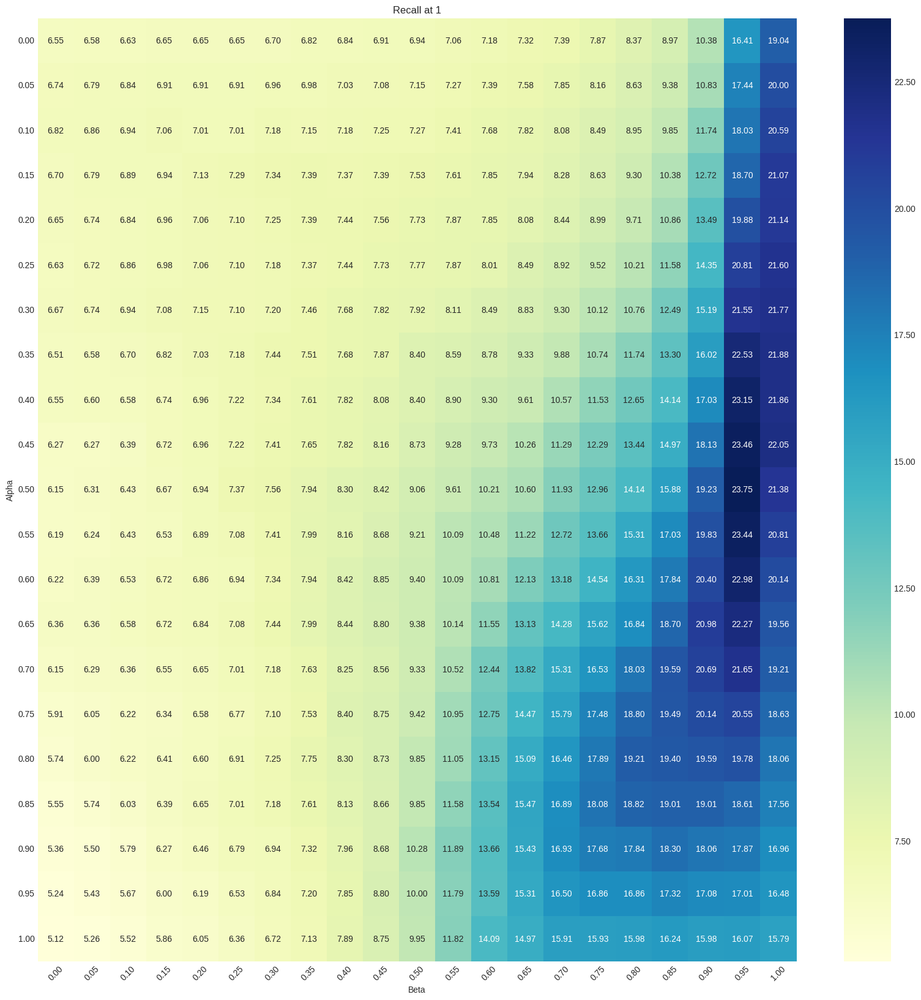

In [30]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

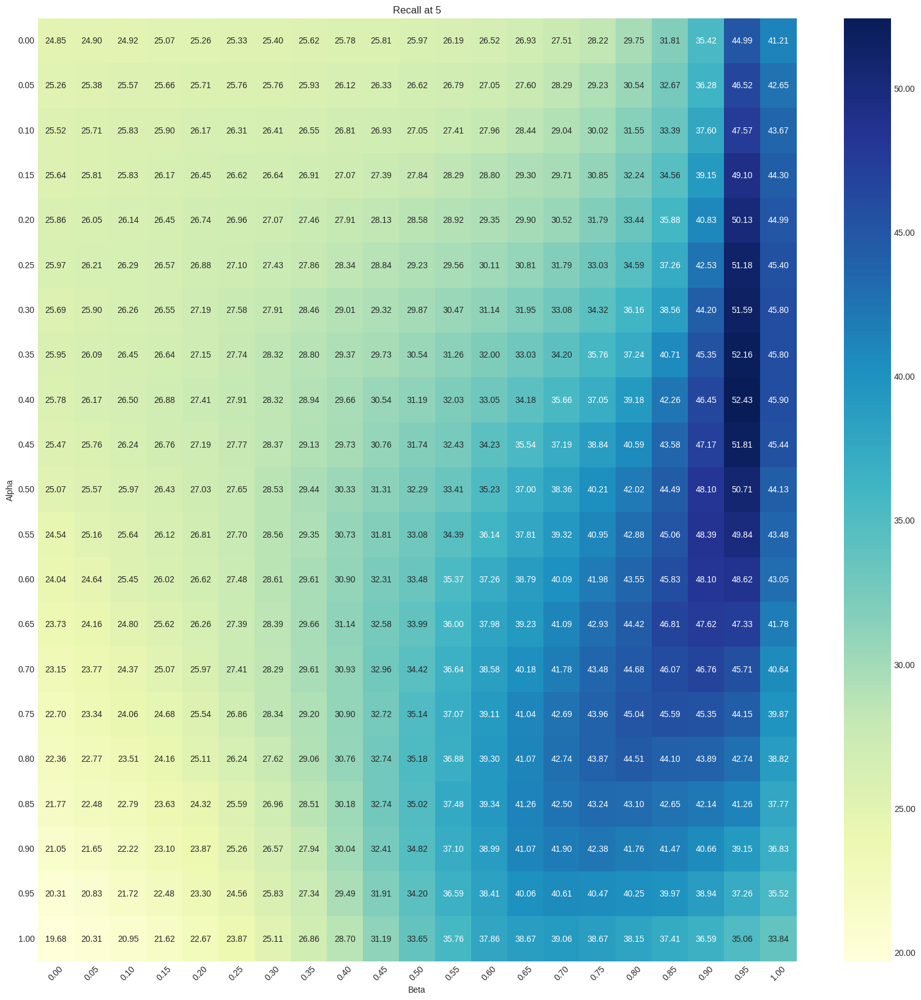

In [31]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

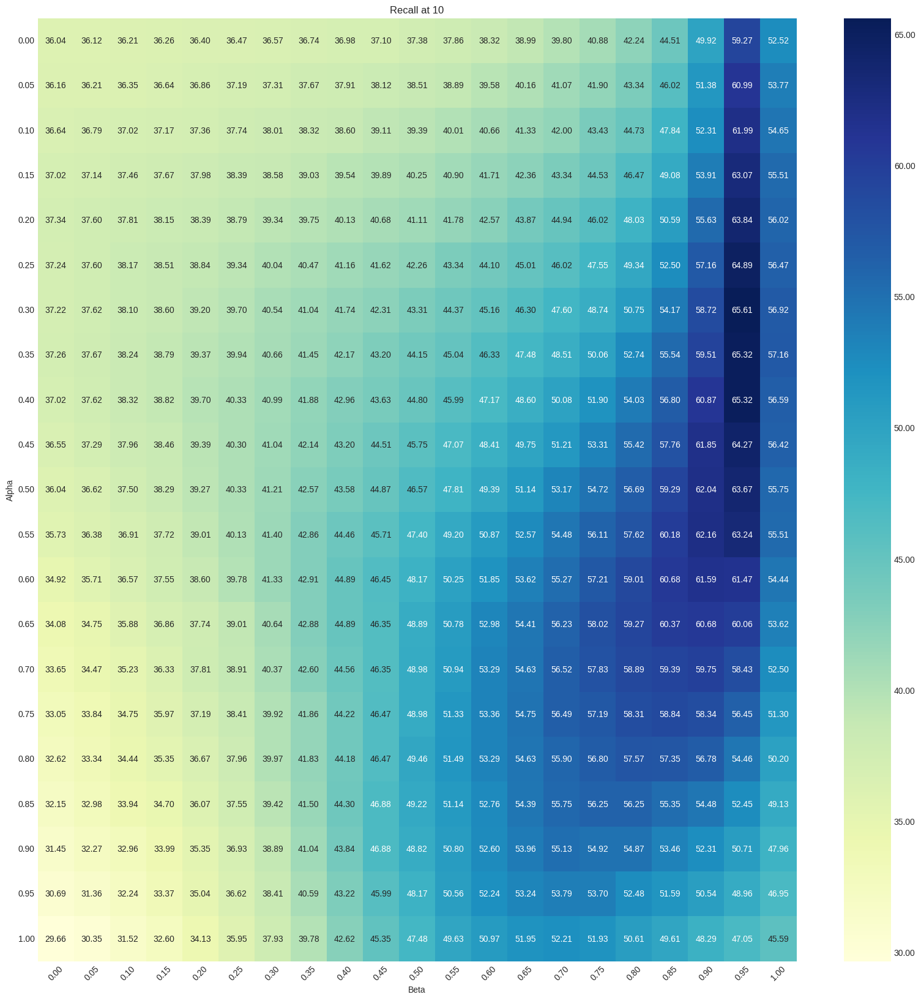

In [32]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

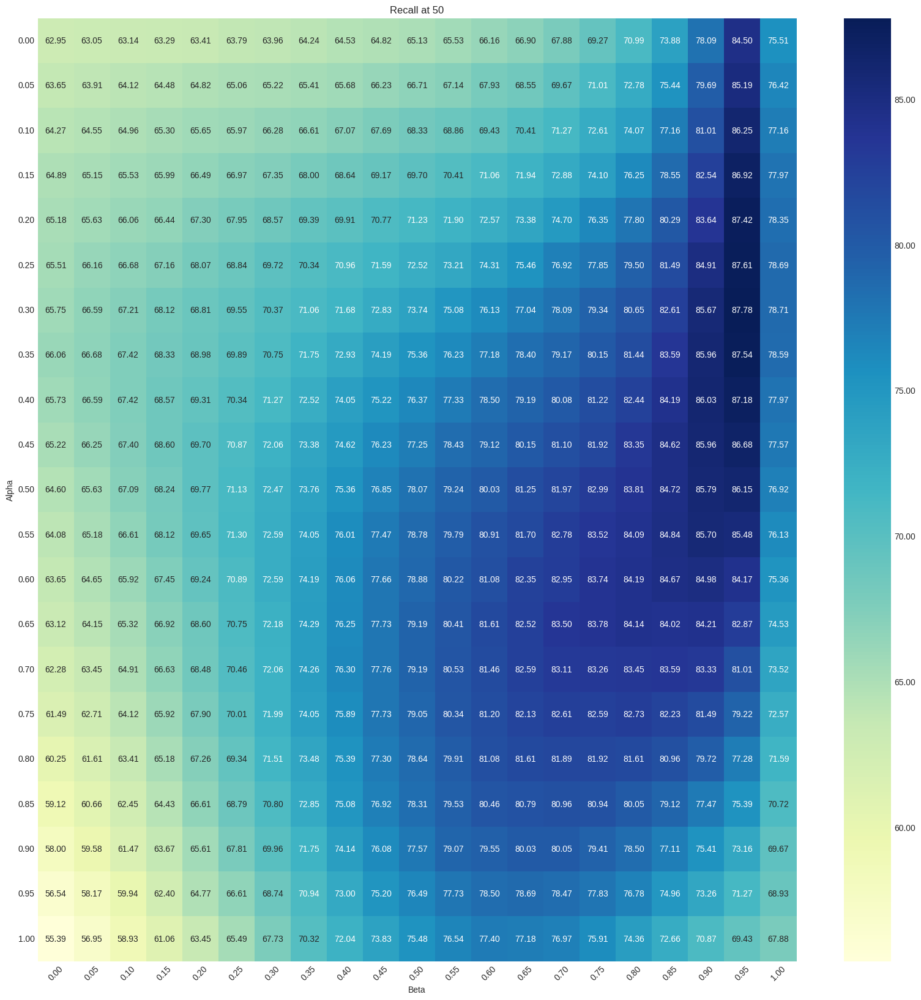

In [33]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

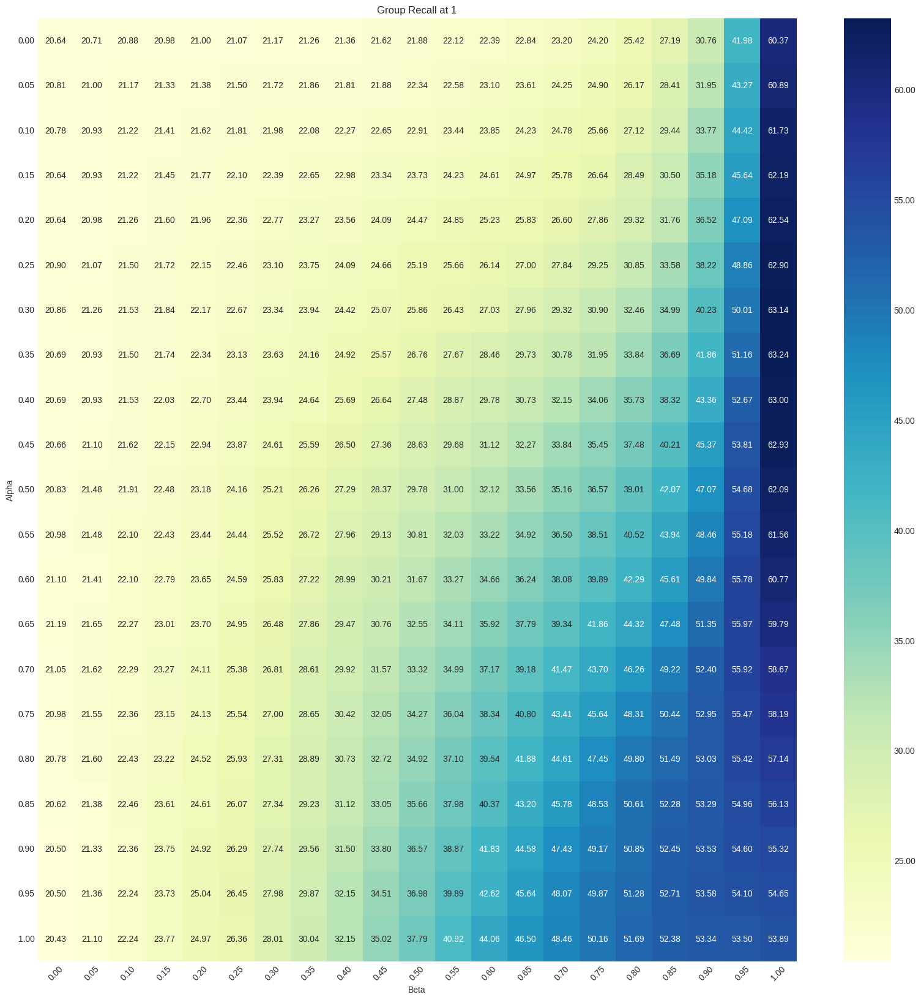

In [34]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

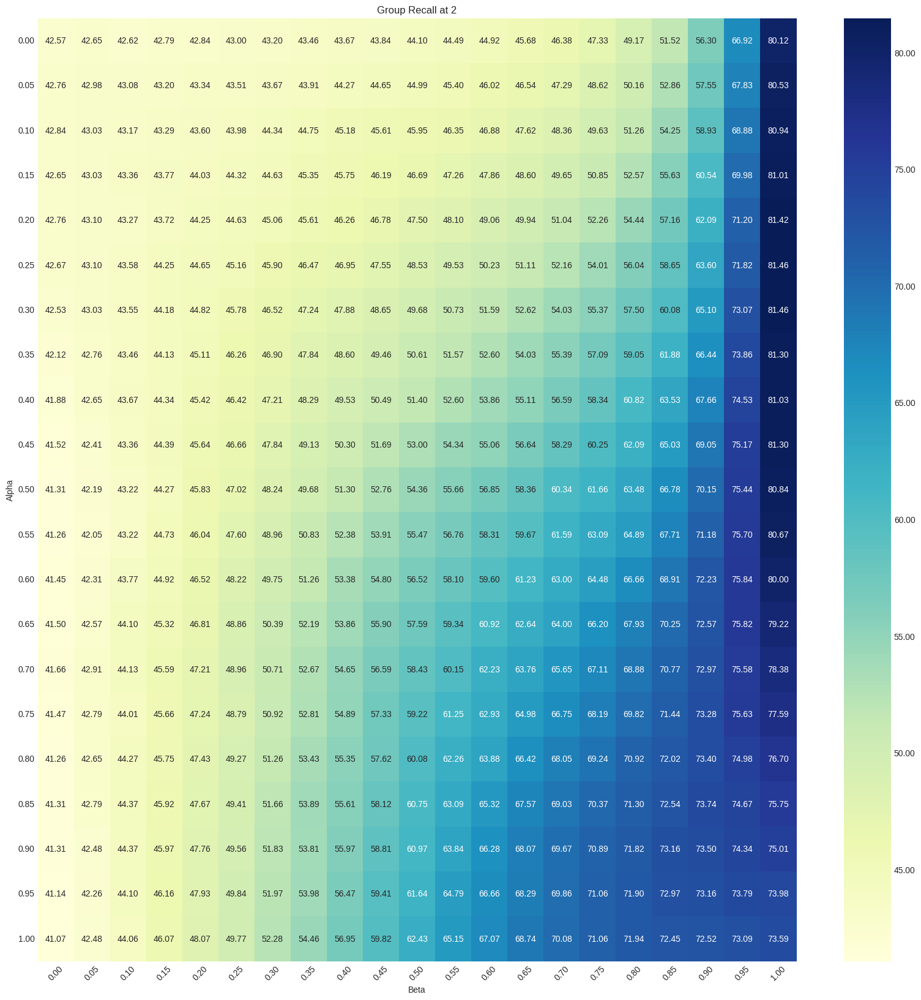

In [35]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

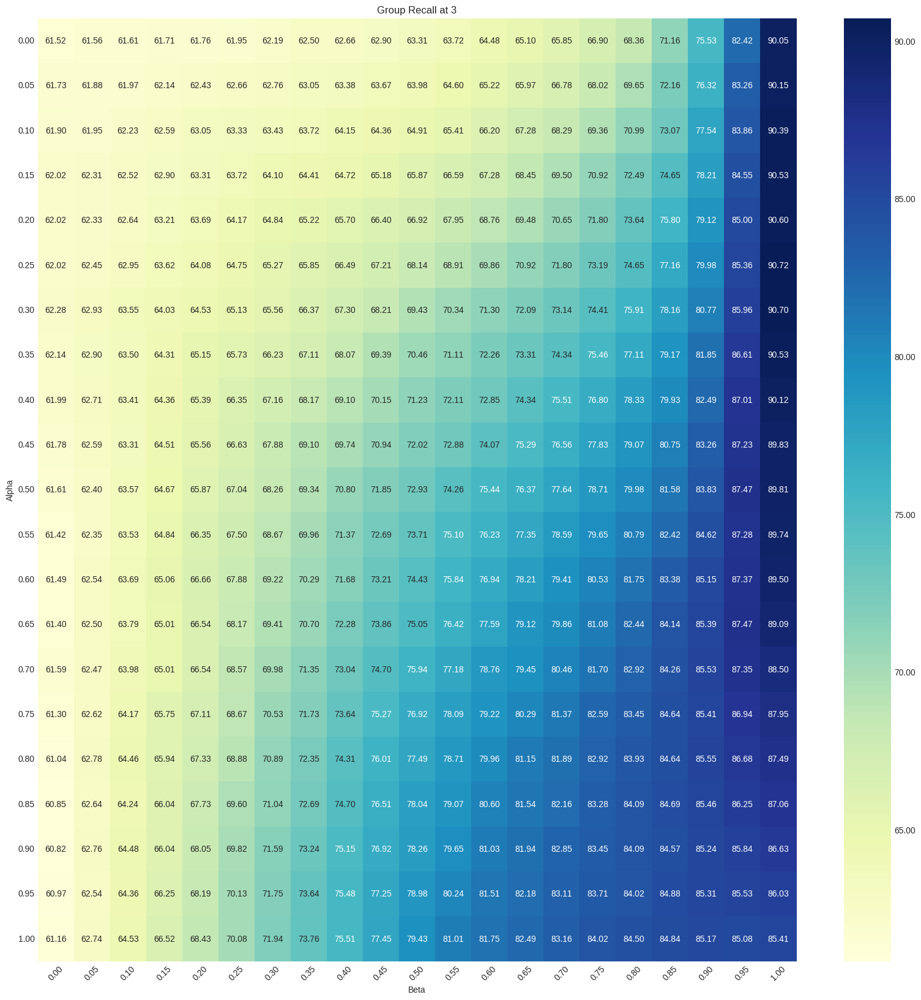

In [36]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [37]:
def compute_results(
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
) -> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on CIRR dataset combining text and image distances.
    
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the CIRR dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    global cache
    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()

    if 'index_cache' not in cache:
        # Define the validation datasets and extract the index features
        classic_val_dataset = CIRRDataset('val', 'classic', preprocess)
    
        multiple_index_features, multiple_index_names = [], []
    
        for i in range(3):
            index_features, index_names, _ = extract_index_features_with_text_captions(
                classic_val_dataset,
                blip_text_encoder,
                text_captions,
                i + 1
            )
            multiple_index_features.append(index_features)
            multiple_index_names.append(index_names)
    
        image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)
        
        cache['index_cache'] = {
            "multiple_index_features": multiple_index_features,
            "multiple_index_names": multiple_index_names,
            "image_index_features": image_index_features,
            "image_index_names": image_index_names,
        }
    else:
        multiple_index_features = cache['index_cache']['multiple_index_features']
        multiple_index_names = cache['index_cache']['multiple_index_names']
        image_index_features = cache['index_cache']['image_index_features']
        image_index_names = cache['index_cache']['image_index_names']

    relative_val_dataset = CIRRDataset('val', 'relative', preprocess)

    all_text_distances = []
    reference_names = None
    target_names = None
    group_members = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_index_features, multiple_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, reference_names, target_names, group_members = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)
        
    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _, _, _ = generate_cirr_val_predictions(
            blip_text_encoder,
            relative_val_dataset,
            combining_function,
            image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Merge text and image distances
    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances

    # Sort the results
    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(
        image_index_names if image_index_names else multiple_index_names[0]
    )[sorted_indices]

    # Delete the reference image from the results
    reference_mask = torch.tensor(
        sorted_index_names != np.repeat(
            np.array(reference_names),
            len(image_index_names)
        ).reshape(len(target_names), -1)
    )

    sorted_index_names = sorted_index_names[reference_mask].reshape(
        sorted_index_names.shape[0],
        sorted_index_names.shape[1] - 1
    )

    # Compute the ground-truth labels with respect to the predictions
    labels = torch.tensor(
        sorted_index_names == np.repeat(
            np.array(target_names),
            len(sorted_index_names[0])
        ).reshape(len(target_names), -1)
    )

    # Compute the subset predictions and ground-truth labels
    group_members = np.array(group_members)
    group_mask = (sorted_index_names[..., None] == group_members[:, None, :]).sum(-1).astype(bool)
    group_labels = labels[group_mask].reshape(labels.shape[0], -1)

    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    assert torch.equal(torch.sum(group_labels, dim=-1).int(), torch.ones(len(target_names)).int())

    # Compute the metrics
    recall_at1 = (torch.sum(labels[:, :1]) / len(labels)).item() * 100
    recall_at5 = (torch.sum(labels[:, :5]) / len(labels)).item() * 100
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
    group_recall_at1 = (torch.sum(group_labels[:, :1]) / len(group_labels)).item() * 100
    group_recall_at2 = (torch.sum(group_labels[:, :2]) / len(group_labels)).item() * 100
    group_recall_at3 = (torch.sum(group_labels[:, :3]) / len(group_labels)).item() * 100
    print(f"Recall Results\nRecall at 1: {recall_at1:.2f}\nRecall at 5: {recall_at5:.2f}\nRecall at 10: {recall_at10:.2f}\nRecall at 50: {recall_at50:.2f}")
    print(f"Group Recall Results\nGroup Recall at 1: {group_recall_at1:.2f}\nGroup Recall at 2: {group_recall_at2:.2f}\nGroup Recall at 3: {group_recall_at3:.2f}")

    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [38]:
sorted_indices, image_index_names, target_names = compute_results(
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.3
)

CIRR val dataset in relative mode initialized


100%|██████████| 131/131 [00:02<00:00, 59.02it/s]


Recall Results
Recall at 1: 21.55
Recall at 5: 51.59
Recall at 10: 65.61
Recall at 50: 87.78

Group Recall Results
Group Recall at 1: 50.01
Group Recall at 2: 73.07
Group Recall at 3: 85.96

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [39]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target_hard = entry['target_hard']
        reference = entry['reference']
        caption = entry['caption']
        img_set = entry['img_set']
        if target_hard not in ground_truths:
            ground_truths[target_hard] = []
        ground_truths[target_hard].append((reference, caption, img_set))
    return ground_truths

 ## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [40]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_caption, img_set = ground_truths.get(ground_truth_target, [('', '', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(2, top_k + 2, figure=fig)
    query_img = Image.open(f'../cirr_dataset/dev/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    ax_text.text(0.5, 0.5, query_caption, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../cirr_dataset/dev/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')
        
    # Subplot for the group members in second row
    img_set_members = img_set['members'] # Array of image paths

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[1, 0])
    query_name = query_img_path
    ax_text.text(0.5, 0.5, query_caption, va='center', ha='center')
    ax_text.axis('off')
    
    # Subplot for the query image
    ax_image = fig.add_subplot(gs[1, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')
    
    for j, img_path in enumerate(img_set_members):
        img = Image.open(f'../cirr_dataset/dev/{img_path}.png')

        ax_result = fig.add_subplot(gs[1, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [41]:
ground_truth = prepare_ground_truths(json.load(open('../cirr_dataset/cirr/captions/cap.rc2.val.json')))

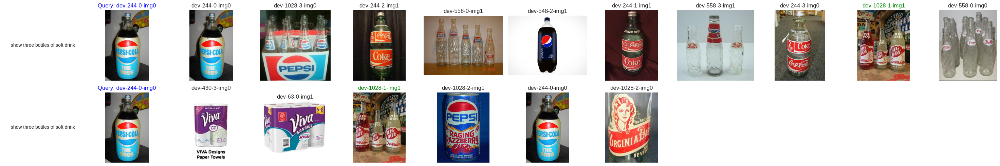

In [42]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0 (Same as the original BLIP4CIR)</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results with alpha=0</div>

In [43]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

CIRR val dataset in relative mode initialized


100%|██████████| 131/131 [00:02<00:00, 61.43it/s]


Recall Results
Recall at 1: 6.94
Recall at 5: 25.97
Recall at 10: 37.38
Recall at 50: 65.13

Group Recall Results
Group Recall at 1: 21.88
Group Recall at 2: 44.10
Group Recall at 3: 63.31

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [44]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [45]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1295, [0, 11, 12, 15, 19, 29, 43, 52, 54, 62])

In [46]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(115, [22, 25, 65, 183, 288, 319, 322, 335, 369, 427])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

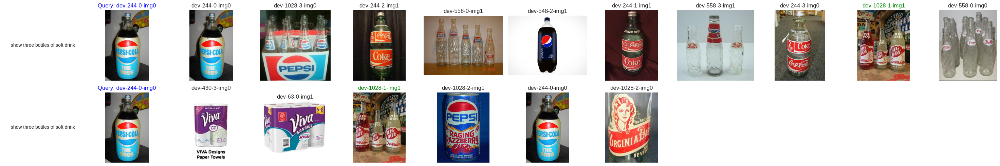

In [47]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

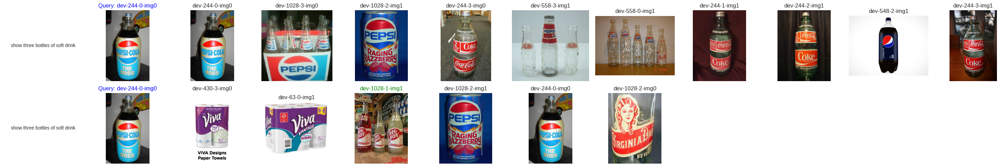

In [48]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

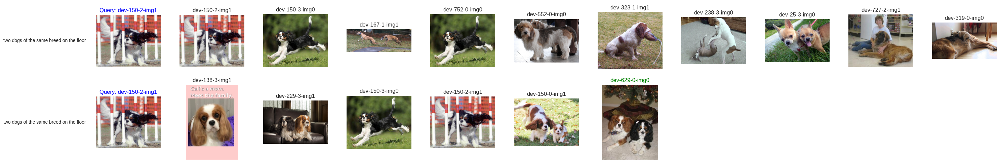

In [49]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

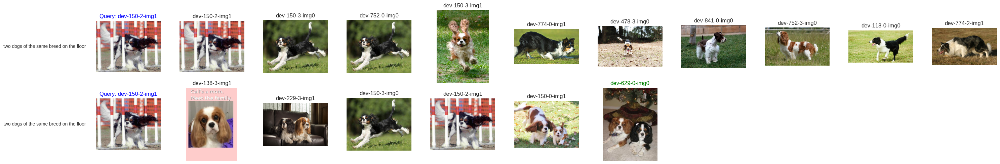

In [50]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

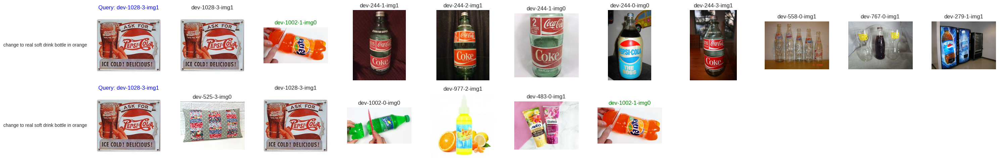

In [51]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

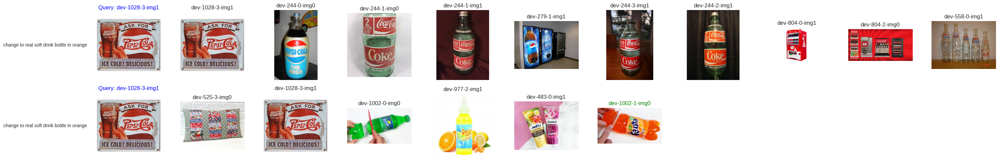

In [52]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)